# I. Transformers

**References:**

1.   Attention is All You Need (2017) Paper: https://arxiv.org/pdf/1706.03762
2.   A Visual Guide to Transformers Neural Networks - by Batool Haider: https://www.youtube.com/playlist?list=PL86uXYUJ7999zE8u2-97i4KG_2Zpufkfb
3.   The transformer lecture in this course by Akshat Gupta (2021): https://www.youtube.com/watch?v=D0COTRYrVEs
4.   Cross-Attention Mechanism in Transformers https://www.geeksforgeeks.org/nlp/cross-attention-mechanism-in-transformers/


 <br><br> The transformer architecture is built on 3 main concepts:


1.   **Token Embeddings**
2.   **Encoder-Decoder Models**
3.   **Attention**


TAs: Euijin Hong (ehong@andrew.cmu.edu), Madhavi Gulavani (mgulavan@andrew.cmu.edu)

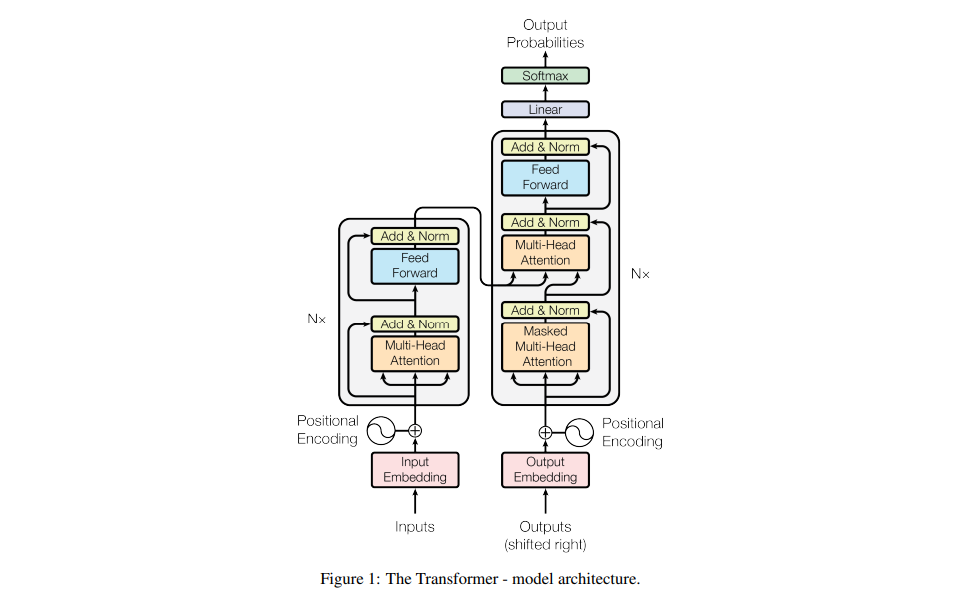

## Three main Components of Transformers

### 1. Token Embeddings:

Representation of tokens (e.g. characters, words, sub-words) in the form of **continuous vectors**, such that they are able to jointly capture linguistic features, like meaning or context <br><br>


### 2. Encoder-Decoder Models

#### Encoder:
Extract the rich linguistic features from the token embeddings from the source sequence and generate feature representations (embeddings) of the source sequence.<br><br>


#### Decoder:
Generate every token of the target sequence, referencing from the final feature embeddings from the Encoder (=rich linguistic features of the source sequence).  <br><br>


### 3. Attention

Scored values representing how much the two distinct feature embeddings are related to each other.


# Input Preprocessing

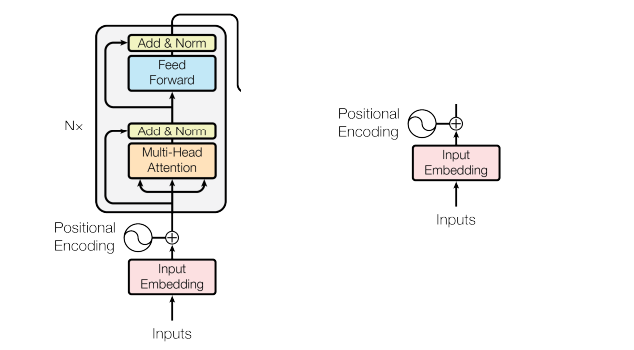


1.   Tokenization
2.   Embedding Layer
3.   Positional Encoding <br><br>

### 1. Input Processing (Tokenization)
Models can only understand numbers and matrices. Hence, the need to convert the words in our input sequences to numerical representations without losing their meaning and context. <br><br>

<b>a) Create Vocabulary:</b> First, we need to create a vocabulary of all the words in our training data, while assigning indices to each word. This is also referred to as tokenization.

<b>b) Map input text sequence to numerical token:</b> Given an input text, each word (or subword) is converted to the corresponding numerical token from the vocabulary, and that is what is fed into the model as inputs.

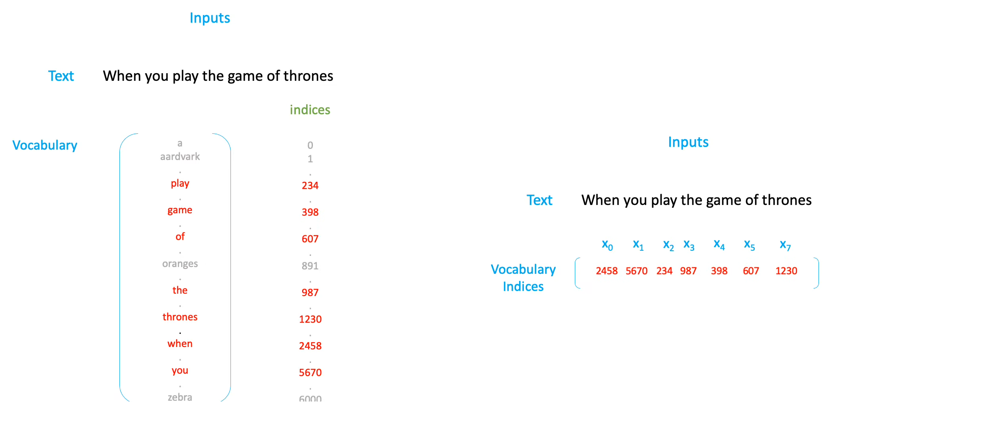

These inputs are then passed onto the embedding layer. <br><br>

### 2. Embedding Layer
This layer takes the tokenized words (indices), and converts them into word embeddings (represented as vectors). Each dimension of the word embedding captures a unique linguistic feature about that word.

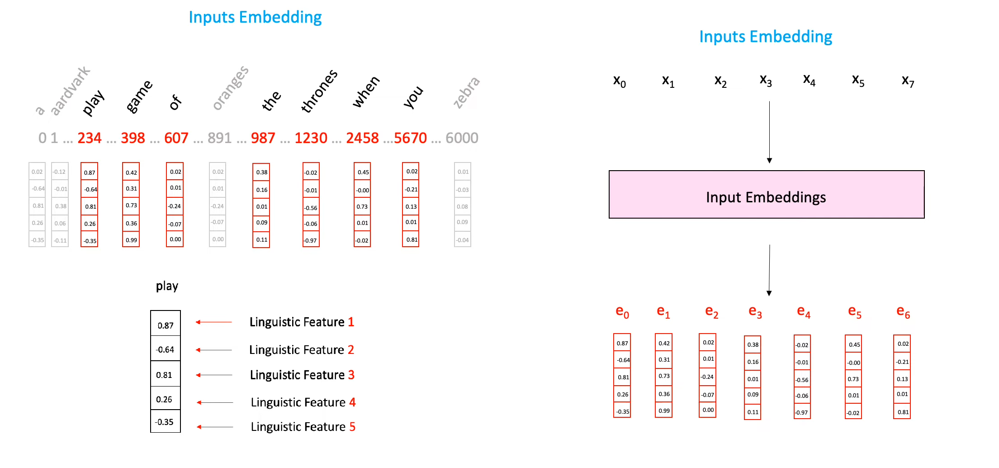

### 3. Positional Encoding
Now, if LSTMs were to take in these embeddings, it will process them sequentially, one at a time, preserving the order information. However, transformers process all the embeddings at once, losing track of the word order information. Word order is very important because it can change the meaning of the sentence.

For example:

a) Even though I did **not** get an A, I was satisfied

b) Even though I did get an A, I was **not** satisfied

The change in position of the word 'not', changes the meaning of each sentence. <br><br>

To solve this, the embeddings are made order aware by creating a new set of position embeddings, and adding them to each word embedding using wave frequencies (sin and cosine).

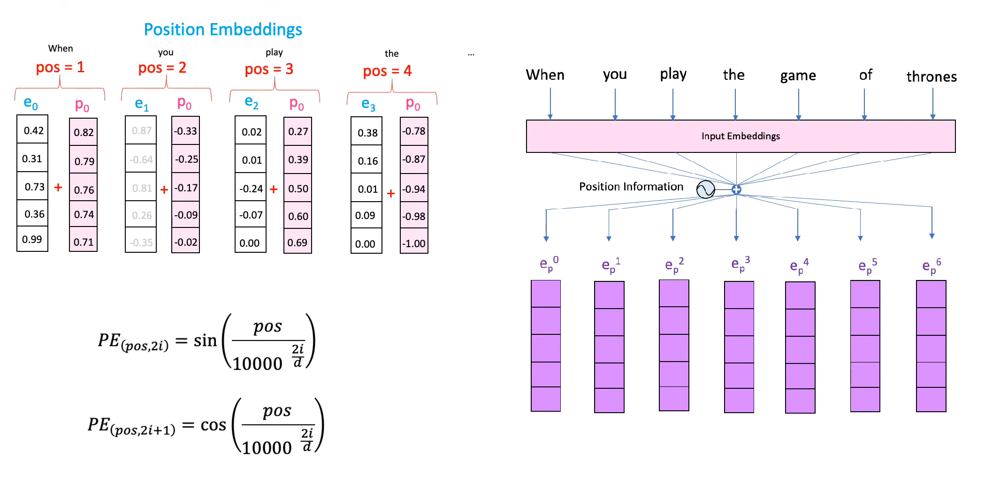

where:

pos = position of embedding

d = size of the word embedding

i = indices of each of the position embedding dimensions


# Encoder

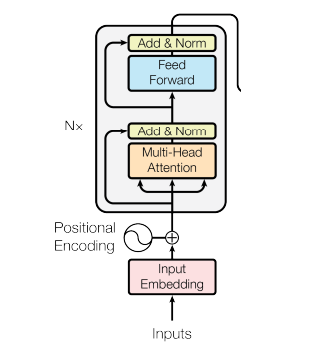

Transformers are able to process the entire sequence at once, through parallel computation using the **attention mechanism.**

## What is Attention?

This is a technique that allows the model
to focus on specific parts of the input when producing the output. It does so, by dynamically weighing the importance of different input elements to capture their relationships. So in summary, it gives different weights (attention) to different parts of the input to make a decision.<br><br>

### Types of Attention:

### 1. Self-Attention:
This refers to the attention the encoder or decoder pay to themselves, in computing their respective outputs, by paying attention to their own context.

<b>The Encoder</b> (which derives feature representations
from the input) pays attention to <b>adjacent inputs</b>.

<b>The decoder</b> (which predicts outputs) pays attention to <b>previous outputs.</b><br><br>

### 2. Cross-Attention:
This refers to the attention the decoder pays to feature representations of the inputs derived by the encoder, since each individual output character relates more to some parts of the input than others. <br><br>


## MultiHead Attention

This is a combination of several self attention heads, where each attention head focuses on different linguistic features (parts) of the input.

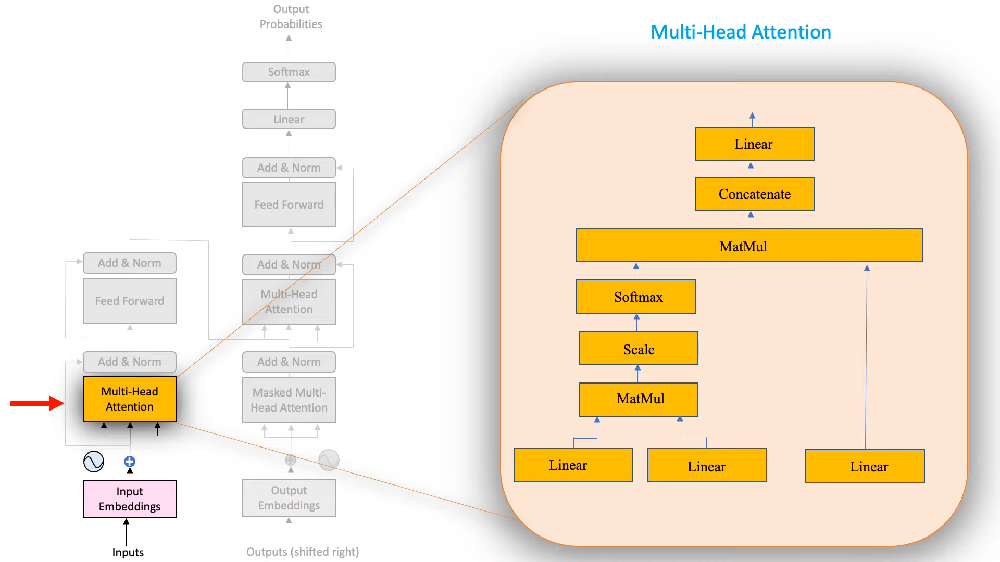

First, 3 copies of the position-aware embeddings are created, and different linear transformations are applied to them by passing them through the 3 linear layers to create the <b>QUERY, KEY,</b> and <b>VALUE</b>.

1.   Query Vector: Represents what a specific token is "looking for" in other tokens within the sequence.

2.   Key Vector: Encodes information about a token in a way that makes it "searchable," acting as metadata for each token.

3.   Value Vector: Represents the actual content or information that the token contributes to the overall representation

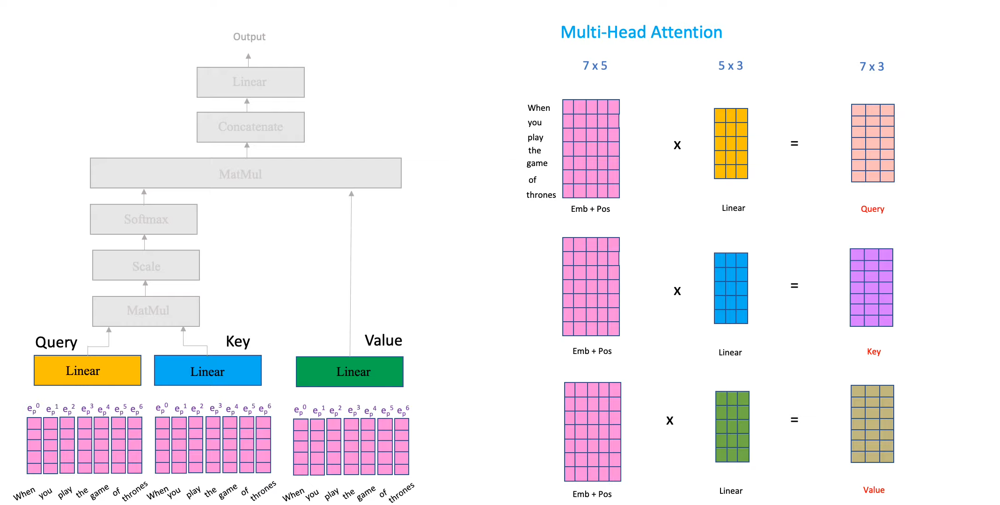

The similarity between the Query and Key is then computed by taking the dot product (MatMul), to get the Attention Filter, which is a matrix of attention scores.

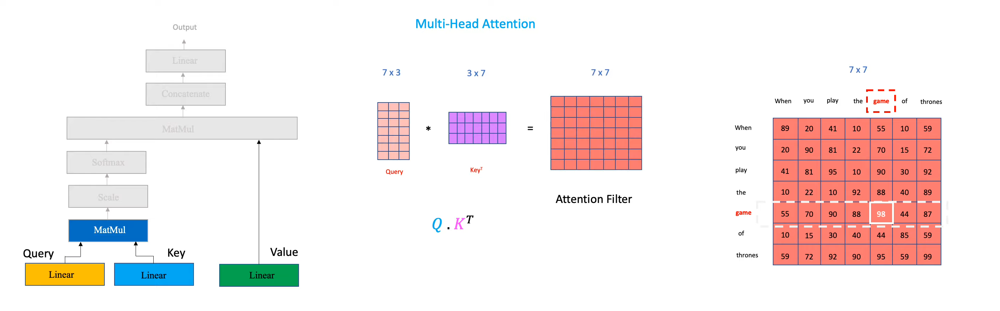

This is then scaled, by dividing the matrix by the dimension of the key vector, and further squashed to be between (0-1) using the softmax operation.

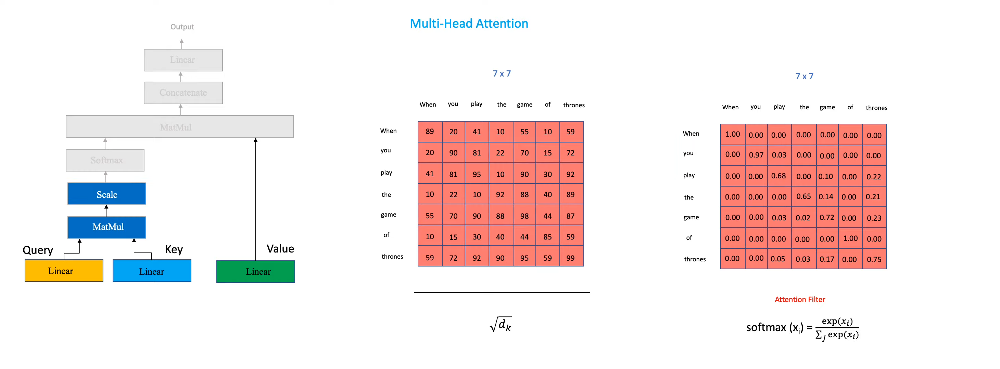

The final filtered value is then derived by taking a dot product of the attention filter with the original VALUE vector.

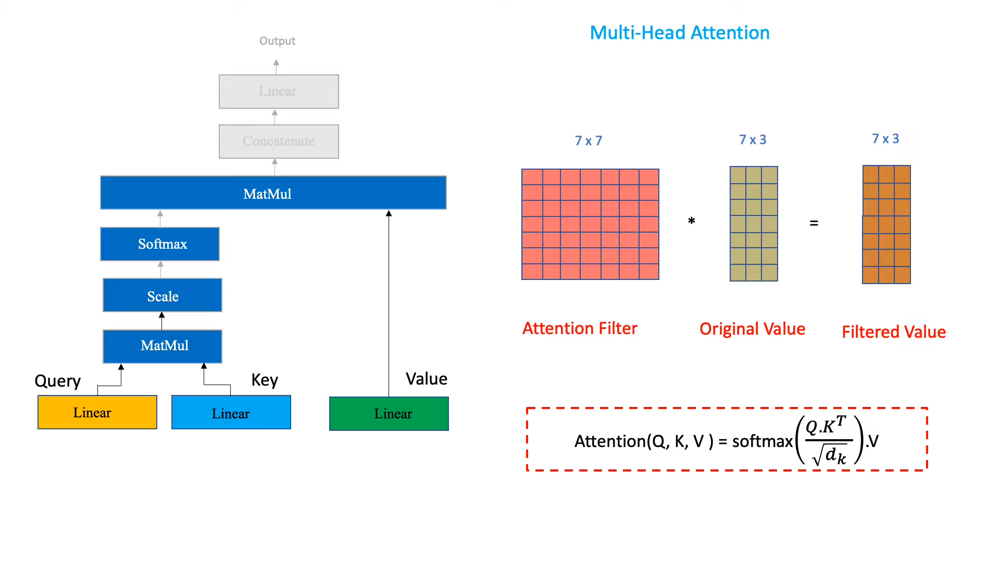

This forms the component of 1 self attention head. Now, multiple self attention heads can be combined to give us a multihead attention layer, with each focusing on a different linguistic feature. The original ATTENTION IS ALL YOU NEED Paper used 8 Multi Head attention heads.

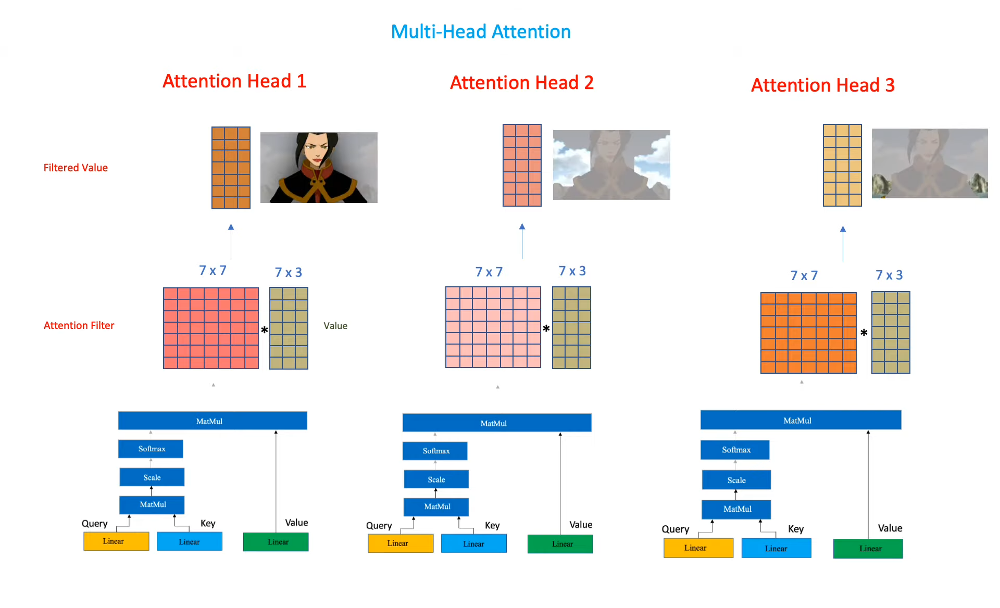

All attention heads in the multihead attention layer are then concatenated together, and passed through a linear layer to give the final combined output of the multihead attention layer, as shown below:

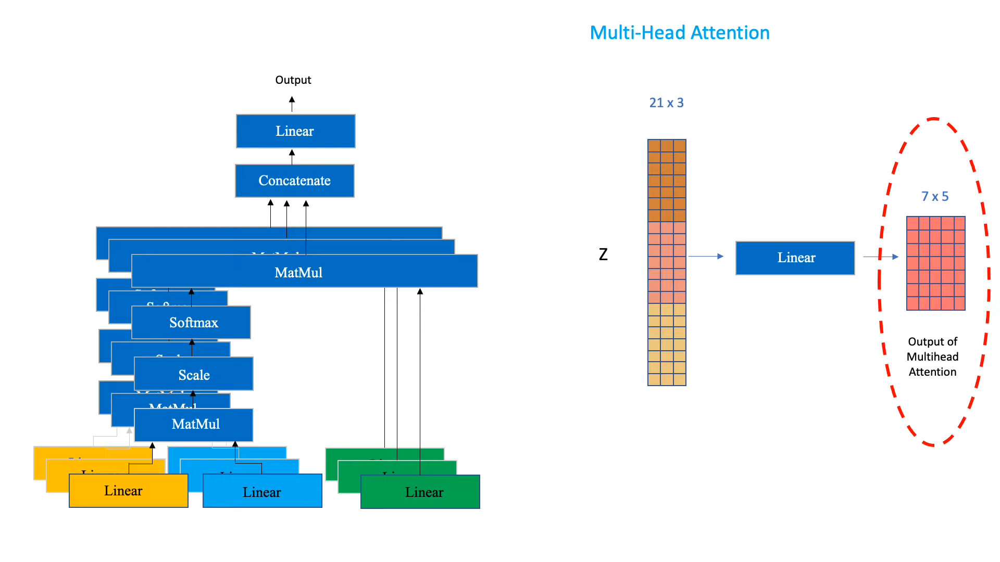

The output of the multihead attention layer is then added to the residual connection of the original position-aware input embeddings, and normalised (by subtracting the mean and dividing by the standard deviation), before passing it through a Feed Forward Layer. The feed forward layer consists of Linear layers with ReLU activations. Its output is then also added to the residual connection from the MultiHead attention layer, and normalized. That finalizes the encoder block

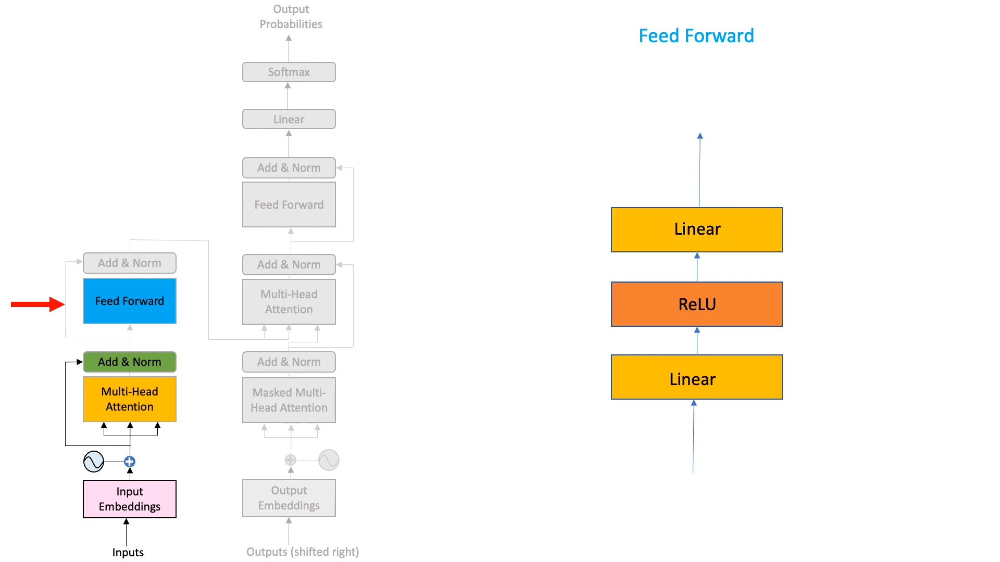

# Decoder

The decoder takes in 2 inputs, one is the final output of the encoder, and position-aware embeddings of the target sequence.

The output of the encoder is projected to corresponding linear layers, generating Key and Value vectors for each input token.

The Query vector is a linear projection of the previous masked self-attention layer of the decoder for each output token.  

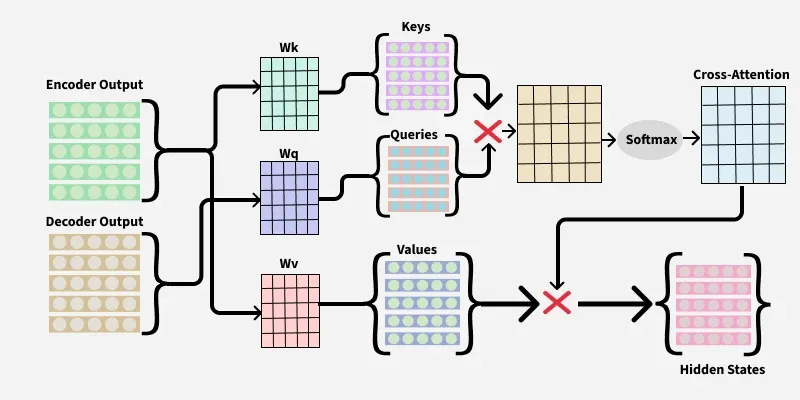

### Masked Multi-Head Attention

Now as mentioned earlier, during training, the target sequence is passed to the decoder using teacher forcing to train the model. However, the decoder is meant to predict the next tokens autoregressively, hence it should only pay attention to tokens that have already been predicted, without paying attention to future tokens. Therefore in the Masked Multi-Head attention layer, the future tokens are masked with (-inf) during self attention, before computing the softmax of the query and key.

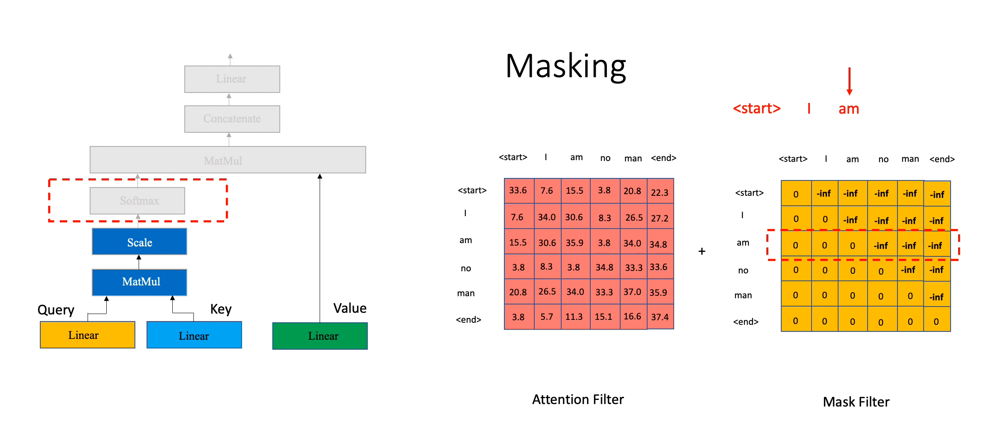

This ensure that, when the softmax is computed, all future tokens go to zero (0), hence only focusing on previously predicted tokens.

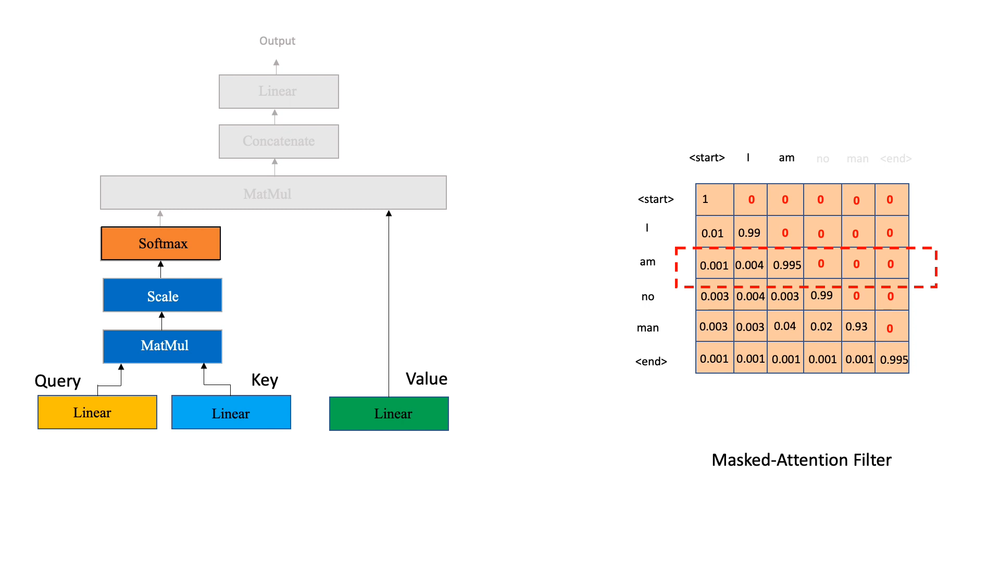

# Teacher Forcing Training

During training, after the decoder predicts the next token based on the encoder representations and previous tokens, the true token that should have been predicted is added and passed to the decoder to predict the next token. This serves as a guide to the model to make adequate corrections subsequently learning to predict the next tokens correctly.

# II. Code Implementations

## (1) Setup

### 1.1 Dependencies

In [52]:
!nvidia-smi

Mon Aug 17 04:47:28 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 610.43.02              KMD Version: 610.43.02     CUDA UMD Version: 13.3     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        On  |   00000000:CF:00.0 Off |                  Off |
| 33%   27C    P8             24W /  450W |   16615MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [53]:
import sys
print(sys.version_info[:2])
assert sys.version_info[:2] == (3, 11), (
    "This notebook needs Python 3.11 (Colab Runtime Version 2025.07)"
    "for torchtext to install and import correctly."
)

(3, 11)


### 1.2 Imports

In [54]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau

import sacrebleu

import torchtext
torchtext.disable_torchtext_deprecation_warning()  # optional: silence torchtext warnings

from torchtext.data.utils import get_tokenizer
from torchtext.vocab import build_vocab_from_iterator
from torchtext.datasets import multi30k

from typing import Tuple
import torchdata
import spacy
import random
import numpy as np
import pandas as pd

# from torchsummaryX import summary
from collections import Counter
from tqdm import tqdm

## (2) Loading Dataset and Tokenization

In [55]:
# torchtext's internal HTTP reader does not retry TLS failures reliably on this server.
# Download the three small archives once with curl; torchtext then uses this cache.
from pathlib import Path
import subprocess

MULTI30K_ROOT = Path("Multi30k")
CACHE_DIR = MULTI30K_ROOT / "datasets" / "Multi30k"
CACHE_DIR.mkdir(parents=True, exist_ok=True)
import hashlib
archives = {
    "training.tar.gz": ("https://raw.githubusercontent.com/neychev/small_DL_repo/master/datasets/Multi30k/training.tar.gz", "20140d013d05dd9a72dfde46478663ba05737ce983f478f960c1123c6671be5e"),
    "validation.tar.gz": ("https://raw.githubusercontent.com/neychev/small_DL_repo/master/datasets/Multi30k/validation.tar.gz", "a7aa20e9ebd5ba5adce7909498b94410996040857154dab029851af3a866da8c"),
    "mmt16_task1_test.tar.gz": ("https://raw.githubusercontent.com/neychev/small_DL_repo/master/datasets/Multi30k/mmt16_task1_test.tar.gz", "6d1ca1dba99e2c5dd54cae1226ff11c2551e6ce63527ebb072a1f70f72a5cd36"),
}
for filename, (url, expected_sha256) in archives.items():
    output = CACHE_DIR / filename
    actual_sha256 = hashlib.sha256(output.read_bytes()).hexdigest() if output.exists() else None
    if actual_sha256 != expected_sha256:
        command = [
            "curl", "-fL", "--http1.1", "--retry", "20",
            "--retry-all-errors", "--retry-delay", "2", "--connect-timeout", "20",
        ]
        if output.exists():
            command.extend(["--continue-at", "-"])
        command.extend(["-o", str(output), url])
        subprocess.run(command, check=True)
        assert hashlib.sha256(output.read_bytes()).hexdigest() == expected_sha256

train_data, valid_data, test_data = torchtext.datasets.Multi30k(
    root=str(MULTI30K_ROOT), split=("train", "valid", "test"), language_pair=("de", "en")
)

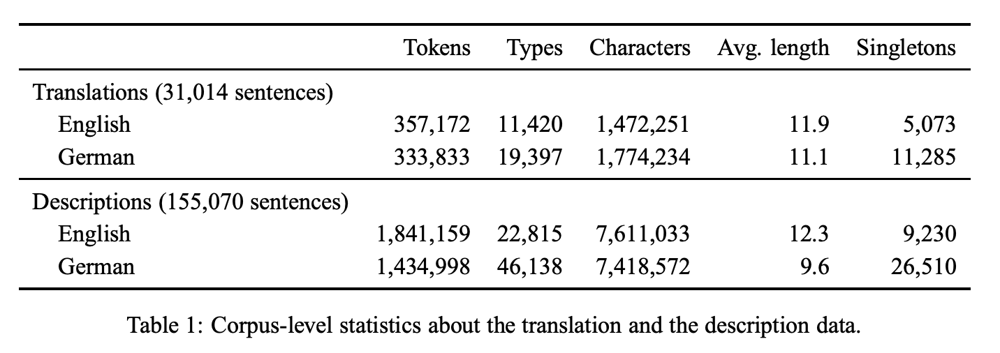

In [56]:
sample_size = 5
de_list, en_list = [], []
counter = 0
for item in train_data:
    de_list.append(item[0])
    en_list.append(item[1])
    counter+= 1
    if counter==sample_size: break
assert len(de_list)==len(en_list)

import pandas
sample_df = pd.DataFrame({"de":de_list, "en":en_list})
display(sample_df)

,de,en
0,Zwei junge weiße Männer sind im Freien in der ...,"Two young, White males are outside near many b..."
1,Mehrere Männer mit Schutzhelmen bedienen ein A...,Several men in hard hats are operating a giant...
2,Ein kleines Mädchen klettert in ein Spielhaus ...,A little girl climbing into a wooden playhouse.
3,Ein Mann in einem blauen Hemd steht auf einer ...,A man in a blue shirt is standing on a ladder ...
4,Zwei Männer stehen am Herd und bereiten Essen zu.,Two men are at the stove preparing food.


### 2.1 Tokenizers

In [57]:
en_tokenizer = get_tokenizer("spacy", language="en_core_web_sm")
de_tokenizer = get_tokenizer("spacy", language="de_core_news_sm")

def tokenize_en(text):
    doc = en_tokenizer(str(text))
    return [token for token in doc]

def tokenize_de(text):
    doc = de_tokenizer(str(text))
    return [token for token in doc]

print("English Text:\t", sample_df['en'][0])
print("English Text in Small Pieces:\t", tokenize_en(sample_df['en'][0]))

print("\nGerman Text:\t", sample_df['de'][0])
print("German Text in Small Pieces:\t", tokenize_en(sample_df['de'][0]))

English Text:	 Two young, White males are outside near many bushes.
English Text in Small Pieces:	 ['Two', 'young', ',', 'White', 'males', 'are', 'outside', 'near', 'many', 'bushes', '.']

German Text:	 Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.
German Text in Small Pieces:	 ['Zwei', 'junge', 'weiße', 'Männer', 'sind', 'i', 'm', 'Freien', 'in', 'der', 'Nähe', 'vieler', 'Büsche', '.']


### 2.2 Vocabulary

In [58]:
class Vocab:
    def __init__(self, tokenizer, min_freq=1, data=None, special_tokens=['<pad>','<sos>','<eos>','<unk>']):
        """
        Args:
            tokenizer(list): function to break text into small units
            min_freq(int): lowest amount of occurence for a single unit
            data(list): list of sentences
            special_tokens(list): list of special tokens to be added to the vocabulary
        """
        self.tokenizer = tokenizer
        self.min_freq = min_freq
        self.special_tokens = special_tokens
        self.build_vocab(data)

    def build_vocab(self, data):
        counter = Counter()
        for text in tqdm(data):
            tokens = self.tokenizer(text)
            counter.update(tokens)

        tokens = [token for token, freq in counter.items() if freq>=self.min_freq]

        tokens = self.special_tokens + tokens
        self.stoi = {token: index for index, token in enumerate(tokens)}
        self.itos = tokens

    def __len__(self):
        return len(self.stoi)

    def __getitem__(self, token):
        return self.stoi.get(token, self.stoi['<unk>'])

def read_file(file_path):
    with open(file_path, "r", encoding="utf8") as f:
        data = [text.strip() for text in f.readlines()]
    return data

en_file = "Multi30k/train/train.en"
de_file = "Multi30k/train/train.de"

train_data_en = read_file(en_file)
train_data_de = read_file(de_file)

print("\n\nTrain English Sample:", train_data_en[0])
print("\n\nTrain German Sample:", train_data_de[0])

EN_VOCAB = Vocab(tokenize_en, min_freq=2, data=train_data_en)
DE_VOCAB = Vocab(tokenize_de, min_freq=2, data=train_data_de)


sample_size = 10
print("\n\nVocab Size English:", len(EN_VOCAB))
print("\nVocab Size German:", len(DE_VOCAB))

print("\nEnglish Vocab Sample: ", dict(list(EN_VOCAB.stoi.items())[:sample_size]))
print("German Vocab Sample: ", dict(list(DE_VOCAB.stoi.items())[:sample_size]))



Train English Sample: Two young, White males are outside near many bushes.


Train German Sample: Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.


  0%|          | 0/29000 [00:00<?, ?it/s]

100%|██████████| 29000/29000 [00:01<00:00, 23527.99it/s]



Vocab Size English: 6191

Vocab Size German: 8014

English Vocab Sample:  {'<pad>': 0, '<sos>': 1, '<eos>': 2, '<unk>': 3, 'Two': 4, 'young': 5, ',': 6, 'White': 7, 'males': 8, 'are': 9}
German Vocab Sample:  {'<pad>': 0, '<sos>': 1, '<eos>': 2, '<unk>': 3, 'Zwei': 4, 'junge': 5, 'weiße': 6, 'Männer': 7, 'sind': 8, 'im': 9}


### 2.3 Dataset Class

In [59]:
import torch
from torch.utils.data import Dataset, DataLoader

class TranslationDataset(Dataset):
    def __init__(self, src_data, tgt_data, src_tokenizer, tgt_tokenizer, src_vocab, tgt_vocab):
        self.src_data = src_data
        self.tgt_data = tgt_data
        self.src_tokenizer = src_tokenizer
        self.tgt_tokenizer = tgt_tokenizer
        self.src_vocab = src_vocab
        self.tgt_vocab = tgt_vocab

        self.src_sos, self.src_eos = self.src_vocab['<sos>'], self.src_vocab['<eos>']
        self.tgt_sos, self.tgt_eos = self.tgt_vocab['<sos>'], self.tgt_vocab['<eos>']

    def __len__(self):
        assert len(self.src_data) == len(self.tgt_data)
        return len(self.src_data)

    def __getitem__(self, index):
        src_txt, tgt_txt = self.src_data[index], self.tgt_data[index]

        src_tokens = [self.src_vocab[token] for token in self.src_tokenizer(src_txt)]
        tgt_tokens = [self.tgt_vocab[token] for token in self.tgt_tokenizer(tgt_txt)]

        src_tokens = [self.src_sos] + src_tokens + [self.src_eos]
        tgt_tokens = [self.tgt_sos] + tgt_tokens + [self.tgt_eos]

        src_tensor = torch.LongTensor(src_tokens)
        tgt_tensor = torch.LongTensor(tgt_tokens)
        return src_tensor, tgt_tensor

    def collate_fn(self, batch):
        src_tensors, tgt_tensors = zip(*batch)
        src_tensors = torch.nn.utils.rnn.pad_sequence(src_tensors, padding_value=self.src_vocab['<pad>'], batch_first=True)
        tgt_tensors = torch.nn.utils.rnn.pad_sequence(tgt_tensors, padding_value=self.tgt_vocab['<pad>'], batch_first=True)

        return src_tensors, tgt_tensors


In [60]:
en_train_file = "Multi30k/train/train.en"
de_train_file = "Multi30k/train/train.de"

en_val_file = "Multi30k/val/val.en"
de_val_file = "Multi30k/val/val.de"

en_test_file = "Multi30k/test/test.en"
de_test_file = "Multi30k/test/test.de"

train_data_en = read_file(en_train_file)
train_data_de = read_file(de_train_file)
val_data_en = read_file(en_val_file)
val_data_de = read_file(de_val_file)
test_data_en = read_file(en_test_file)
test_data_de = read_file(de_test_file)

train_dataset = TranslationDataset(train_data_en, train_data_de, tokenize_en, tokenize_de, EN_VOCAB, DE_VOCAB)
val_dataset = TranslationDataset(val_data_en, val_data_de, tokenize_en, tokenize_de, EN_VOCAB, DE_VOCAB)
test_dataset = TranslationDataset(test_data_en, test_data_de, tokenize_en, tokenize_de, EN_VOCAB, DE_VOCAB)

print("Raw English Text:",train_data_en[0])
print("English Text in Small Pieces:",tokenize_en(train_data_en[0]))
print("Tokenized English Text:",train_dataset[0][0])
# print("Tokenized English Text with SOS and EOS:",train_dataset[0][0])
print("\n")
print("Raw German Text:",train_data_de[0])
print("German Text in Small Pieces:",tokenize_de(train_data_de[0]))
print("Tokenized German Text:",train_dataset[0][1])
# print("Tokenized German Text with SOS and EOS:",train_dataset[0][1])

Raw English Text: Two young, White males are outside near many bushes.
English Text in Small Pieces: ['Two', 'young', ',', 'White', 'males', 'are', 'outside', 'near', 'many', 'bushes', '.']
Tokenized English Text: tensor([ 1,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14,  2])


Raw German Text: Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.
German Text in Small Pieces: ['Zwei', 'junge', 'weiße', 'Männer', 'sind', 'im', 'Freien', 'in', 'der', 'Nähe', 'vieler', 'Büsche', '.']
Tokenized German Text: tensor([ 1,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,  2])


### 2.4 Dataloader

In [61]:
BATCH_SIZE = 128

In [62]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=train_dataset.collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=val_dataset.collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=test_dataset.collate_fn)

In [63]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## (3) Positional Encoding

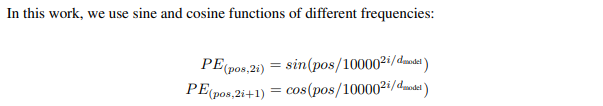

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 1

In [64]:
import math

class PositionalEncoding(nn.Module):

    def __init__(self, d_model, max_seq_len=1000, dropout=0.1):
        """
        Initialize the PositionalEncoding module.

        Args:
        d_model (int): The dimensionality of the input.
        max_seq_len (int): The maximum length of the input sequence.
        dropout (float, optional): The dropout probability. Defaults to 0.1.
        """
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(dropout)

        pe = torch.zeros(max_seq_len, d_model)

        position = torch.arange(0, max_seq_len, dtype=torch.float).unsqueeze(1)

        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-torch.log(torch.tensor(10000.0)) / d_model))

        # TODOS
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)

        # Registering the buffer allows you to capture it in a state_dict
        # even though it is not a learnable parameter.
        # Source: https://pytorch.org/docs/stable/notes/modules.html
        self.register_buffer('pe', pe)

    def forward(self, x, debug=False):
        """
        Forward pass for PositionalEncoding.

        Args:
        x (Tensor): The input tensor of shape (batch_size, seq_length, d_model).

        Returns:
        Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """
        # Consider the Resulting Dimension after Positional Encoding
        pe = self.pe
        if debug:
            print("Input Shape:",x.shape)
            print("Positional Encoder Shape:",pe.shape)
        x = x + pe[:, :x.size(1), :]
        x = self.dropout(x)
        return x

x = torch.tensor(np.random.rand(3,256,256))
model = PositionalEncoding(256)
out = model.forward(x, debug=True)
assert x.shape == out.shape

Input Shape: torch.Size([3, 256, 256])
Positional Encoder Shape: torch.Size([1, 1000, 256])


## (4) Attention Mechanism

### 4.1 Self Attention Mechanism

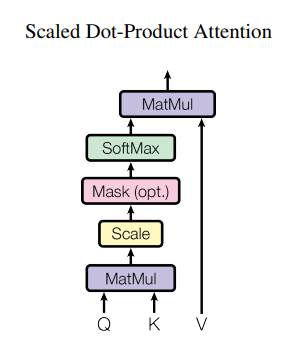

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 2

In [65]:
import torch
import numpy as np
from torchinfo import summary as torchinfo_summary

class SelfAttention(torch.nn.Module):
    def __init__(self, d_model=256):
        super(SelfAttention, self).__init__()

        self.d_model = d_model

        self.query = torch.nn.Linear(d_model, d_model)
        self.key = torch.nn.Linear(d_model, d_model)
        self.value = torch.nn.Linear(d_model, d_model)

    def forward(self, x, mask=None):
        Q = self.query(x)
        K = self.key(x)
        V = self.value(x)

        # TODOS
        # d_k has the same dimension of the model
        d_k = self.d_model

        # TODO: Check the above graph. Remember to check the dimensions of inputs in operation.
        matmul_output = Q @ K.transpose(-2, -1)

        # TODO: Check the above graph
        scale_output = matmul_output / d_k ** (0.5)

        if mask is not None:
            scale_output = scale_output.masked_fill(mask==0, float('-inf'))

        softmax_output = torch.nn.functional.softmax(scale_output, dim=-1)

        final_output = torch.matmul(softmax_output, V)
        return final_output


model = SelfAttention(256)
x = torch.zeros(2, 3, 256, 256)
model_summary = torchinfo_summary(model, input_data=[x])
model_summary

Layer (type:depth-idx)                   Output Shape              Param #
SelfAttention                            [2, 3, 256, 256]          --
├─Linear: 1-1                            [2, 3, 256, 256]          65,792
├─Linear: 1-2                            [2, 3, 256, 256]          65,792
├─Linear: 1-3                            [2, 3, 256, 256]          65,792
Total params: 197,376
Trainable params: 197,376
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.39
Input size (MB): 1.57
Forward/backward pass size (MB): 9.44
Params size (MB): 0.79
Estimated Total Size (MB): 11.80

### 4.2 Multi Head Attention

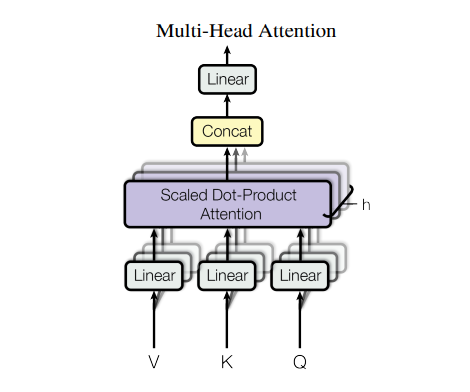

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 3

In [66]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MultiHeadSelfAttention(nn.Module):

    def __init__(self, d_model, num_heads):
        """
        Initialize the MultiHeadSelfAttention module.

        Args:
        d_model (int): The dimensionality of the input.
        num_heads (int): The number of attention heads.
        """
        super(MultiHeadSelfAttention, self).__init__()
        self.d_model = d_model
        self.num_heads = num_heads

        # TODO: To get the head dimension, you subdivide the model's dimension into its heads
        self.head_dim = d_model // num_heads
        self.d_k = self.head_dim

        assert self.head_dim * self.num_heads == self.d_model

        self.query = torch.nn.Linear(self.d_model, self.d_model)
        self.key = torch.nn.Linear(self.d_model, self.d_model)
        self.value = torch.nn.Linear(self.d_model, self.d_model)

        self.output = torch.nn.Linear(self.d_model, self.d_model)

    def forward(self, q, k, v, mask=None):
        batch_size = q.shape[0]
        seq_len = q.shape[1]
        k_len = k.shape[1]

        Q = self.query(q)
        K = self.key(k)
        V = self.value(v)

        # reshaping for multiple heads
        # TODO: Reshaping from [B, S, DModel] to [B, H, S, DModel]
        Q = Q.view(batch_size, seq_len, self.num_heads, self.head_dim).transpose(1,2)
        K = K.view(batch_size, k_len, self.num_heads, self.head_dim).transpose(1,2)
        V = V.view(batch_size, k_len, self.num_heads, self.head_dim).transpose(1,2)

        matmul_output = torch.matmul(Q, K.transpose(-2,-1))
        scale_output = matmul_output / torch.sqrt(torch.tensor(self.d_k, dtype=torch.float32))

        if mask is not None:
            scale_output = scale_output.masked_fill(mask==0, float('-inf'))

        softmax_output = torch.nn.functional.softmax(scale_output, dim=-1)
        scale_dot_output = torch.matmul(softmax_output, V)

        # TODO: Reshaping back from [B, H, S, DModel] to [B, S, DModel]
        attention_output = scale_dot_output.transpose(1,2).reshape(scale_dot_output.size(0),-1,self.d_model)

        output = self.output(attention_output)
        return output

model = MultiHeadSelfAttention(256, 4)
x = torch.zeros(3, 256, 256)
model_summary = torchinfo_summary(model, input_data=[x,x,x])
model_summary

Layer (type:depth-idx)                   Output Shape              Param #
MultiHeadSelfAttention                   [3, 256, 256]             --
├─Linear: 1-1                            [3, 256, 256]             65,792
├─Linear: 1-2                            [3, 256, 256]             65,792
├─Linear: 1-3                            [3, 256, 256]             65,792
├─Linear: 1-4                            [3, 256, 256]             65,792
Total params: 263,168
Trainable params: 263,168
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.79
Input size (MB): 2.36
Forward/backward pass size (MB): 6.29
Params size (MB): 1.05
Estimated Total Size (MB): 9.70

### 4.3 Position Wise Feed Forward

Point Wise Feed Forward

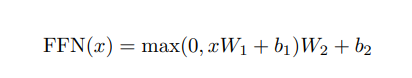

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


ReLU Graph

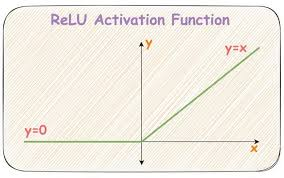

CHECKPOINT 4

In [67]:
class PositionwiseFeedForward(nn.Module):

    def __init__(self, d_model, d_ff, dropout=0.1):
        """
        Initialize the PositionwiseFeedForward module.

        Args:
        d_model (int): The dimensionality of the input.
        d_ff (int): The dimensionality of the hidden layer in the feed-forward network.
        dropout (float, optional): The dropout probability. Defaults to 0.1.
        """
        super(PositionwiseFeedForward, self).__init__()
        self.linear1 = nn.Linear(d_model, d_ff)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(d_ff, d_model)

    def forward(self, x):
        """
        Forward pass for PositionwiseFeedForward.

        Args:
        x (Tensor): The input tensor of shape (batch_size, seq_length, d_model).

        Returns:
        Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """
        out = self.linear1(x)

        # TODO: Which activation function that takes a considers everything below 0 as 0?
        out = torch.relu(out)

        out = self.dropout(out)
        out = self.linear2(out)

        return out

model = PositionwiseFeedForward(256, 256)
x = torch.zeros(2, 3, 256, 256)
model_summary = torchinfo_summary(model, input_data=[x])
model_summary

Layer (type:depth-idx)                   Output Shape              Param #
PositionwiseFeedForward                  [2, 3, 256, 256]          --
├─Linear: 1-1                            [2, 3, 256, 256]          65,792
├─Dropout: 1-2                           [2, 3, 256, 256]          --
├─Linear: 1-3                            [2, 3, 256, 256]          65,792
Total params: 131,584
Trainable params: 131,584
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.26
Input size (MB): 1.57
Forward/backward pass size (MB): 6.29
Params size (MB): 0.53
Estimated Total Size (MB): 8.39

## (5) Add & Norm

Layer Normalization | Add & Norm

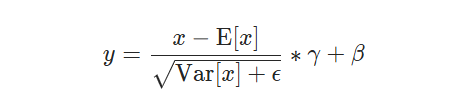

https://pytorch.org/docs/stable/generated/torch.nn.LayerNorm.html

CHECKPOINT 5

In [68]:
class AddNorm(nn.Module):

    def __init__(self, d_model, eps=1e-6):
        """
        Initialize the AddNorm module.

        Args:
        d_model (int): The dimensionality of the input.
        eps (float, optional): A small constant for numerical stability. Defaults to 1e-6.
        """
        super(AddNorm, self).__init__()
        self.gamma = torch.nn.Parameter(torch.ones(d_model))
        self.beta = torch.nn.Parameter(torch.zeros(d_model))
        self.eps = eps

    def forward(self, x, residual):
        """
        Forward pass for AddNorm.

        Args:
        x (Tensor): The input tensor of shape (batch_size, seq_length, d_model).
        residual (Tensor): The residual tensor of the same shape as the input tensor.

        Returns:
        Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """
        # TODO: Create a residual connection
        x = x + residual

        # TODO: Normalize Per Layer
        mean = x.mean(dim=-1, keepdim=True)
        std = torch.sqrt((x - mean) ** 2).mean(dim=-1, keepdim=True) + self.eps
        norm = (x - mean) / std
        layernorm = self.gamma * norm + self.beta

        return layernorm

x = torch.zeros(3,256,256)
residual = torch.ones(3, 256, 256)
addnorm = AddNorm(256)
norm_x = addnorm.forward(x, residual)
# print(norm_x)

assert norm_x.shape == x.shape, "Normalized Shape should match Input Shape"
assert torch.allclose(torch.zeros(3,256,256), norm_x)
print("### PASSED ###")

### PASSED ###


## (6) Transformer Encoder

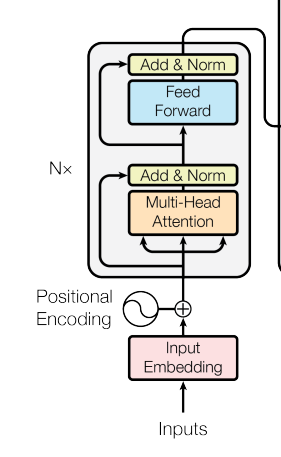

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 6

In [69]:
class EncoderBlock(nn.Module):
    def __init__(self, d_model, num_heads, d_ff, dropout=0.1):
        """
        Initialize the EncoderBlock module.

        Args:
        d_model (int): The dimensionality of the input.
        num_heads (int): The number of attention heads.
        d_ff (int): The dimensionality of the hidden layer in the feed-forward network.
        dropout (float, optional): The dropout probability. Defaults to 0.1.
        """
        super(EncoderBlock, self).__init__()

        # TODO: Define the blocks in the Encoder of Transformers
        self.self_attn = MultiHeadSelfAttention(d_model, num_heads)
        self.norm1 = AddNorm(d_model)
        self.ffn = PositionwiseFeedForward(d_model, d_ff, dropout)
        self.norm2 = AddNorm(d_model)

    def forward(self, x, mask=None):
        """
        Forward pass for EncoderBlock.

        Args:
        x (Tensor): The input tensor of shape (batch_size, seq_length, d_model).
        mask (Tensor, optional): The mask tensor for ignoring certain elements. Defaults to None.

        Returns:
        Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """
        # TODO: Forward Pass in Each Block
        x1 = self.self_attn(x,x,x,mask)
        x = self.norm1(x1,x)
        x1 = self.ffn(x)
        x = self.norm2(x1,x)

        return x

model = EncoderBlock(256, 4, 256)
x = torch.zeros(3, 256, 256)
mask_example = torch.zeros(3, 1, 256, 256)
model_summary = torchinfo_summary(model, input_data=[x, mask_example])
print(model_summary)
print("### PASSED ###")

Layer (type:depth-idx)                   Output Shape              Param #
EncoderBlock                             [3, 256, 256]             --
├─MultiHeadSelfAttention: 1-1            [3, 256, 256]             --
│    └─Linear: 2-1                       [3, 256, 256]             65,792
│    └─Linear: 2-2                       [3, 256, 256]             65,792
│    └─Linear: 2-3                       [3, 256, 256]             65,792
│    └─Linear: 2-4                       [3, 256, 256]             65,792
├─AddNorm: 1-2                           [3, 256, 256]             512
├─PositionwiseFeedForward: 1-3           [3, 256, 256]             --
│    └─Linear: 2-5                       [3, 256, 256]             65,792
│    └─Dropout: 2-6                      [3, 256, 256]             --
│    └─Linear: 2-7                       [3, 256, 256]             65,792
├─AddNorm: 1-4                           [3, 256, 256]             512
Total params: 395,776
Trainable params: 395,776
Non-trainab

## (7) Transformer Decoder

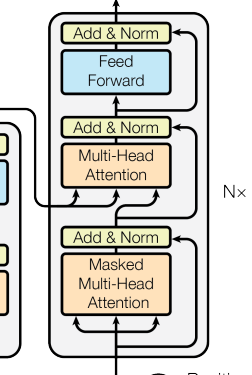

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 7

In [70]:
class DecoderBlock(nn.Module):
    def __init__(self, d_model, num_heads, d_ff, dropout=0.1):
        """
        Initialize the DecoderBlock module.

        Args:
        d_model (int): The dimensionality of the input.
        num_heads (int): The number of attention heads.
        d_ff (int): The dimensionality of the hidden layer in the feed-forward network.
        dropout (float, optional): The dropout probability. Defaults to 0.1.
        """
        super(DecoderBlock, self).__init__()

        # TODO: Define all the blocks in Decoder of Transformers
        self.self_attn = MultiHeadSelfAttention(d_model, num_heads)
        self.norm1 = AddNorm(d_model)
        self.enc_dec_attn = MultiHeadSelfAttention(d_model, num_heads)
        self.norm2 = AddNorm(d_model)
        self.ffn = PositionwiseFeedForward(d_model, d_ff, dropout)
        self.norm3 = AddNorm(d_model)

    def forward(self, x, enc_output, src_mask=None, tgt_mask=None):
        """
        Forward pass for DecoderBlock.

        Args:
        x (Tensor): The target input tensor of shape (batch_size, seq_length, d_model).
        enc_output (Tensor): The encoder output tensor of shape (batch_size, seq_length, d_model).
        src_mask (Tensor, optional): The source mask tensor for ignoring certain elements. Defaults to None.
        tgt_mask (Tensor, optional): The target mask tensor for ignoring certain elements. Defaults to None.

        Returns:
        Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """

        # TODO: Forward Passing in all the blocks. Remember to add masking.
        residual = self.self_attn(x,x,x,tgt_mask)
        x = self.norm1(residual,x)

        residual = self.enc_dec_attn(x,enc_output,enc_output,src_mask)
        x = self.norm2(residual,x)

        residual = self.ffn(x)
        x = self.norm3(residual,x)

        return x

model = DecoderBlock(256, 4, 256)
x = torch.zeros(3, 256, 256)
encoder_output = torch.zeros(3, 256, 256)
mask_example = torch.zeros(3, 1, 256, 256)
model_summary = torchinfo_summary(model, input_data=[x, encoder_output, mask_example, mask_example])
model_summary

Layer (type:depth-idx)                   Output Shape              Param #
DecoderBlock                             [3, 256, 256]             --
├─MultiHeadSelfAttention: 1-1            [3, 256, 256]             --
│    └─Linear: 2-1                       [3, 256, 256]             65,792
│    └─Linear: 2-2                       [3, 256, 256]             65,792
│    └─Linear: 2-3                       [3, 256, 256]             65,792
│    └─Linear: 2-4                       [3, 256, 256]             65,792
├─AddNorm: 1-2                           [3, 256, 256]             512
├─MultiHeadSelfAttention: 1-3            [3, 256, 256]             --
│    └─Linear: 2-5                       [3, 256, 256]             65,792
│    └─Linear: 2-6                       [3, 256, 256]             65,792
│    └─Linear: 2-7                       [3, 256, 256]             65,792
│    └─Linear: 2-8                       [3, 256, 256]             65,792
├─AddNorm: 1-4                           [3, 256, 25

## (8) Transformer

### 8.1 Helper Functions - Masking

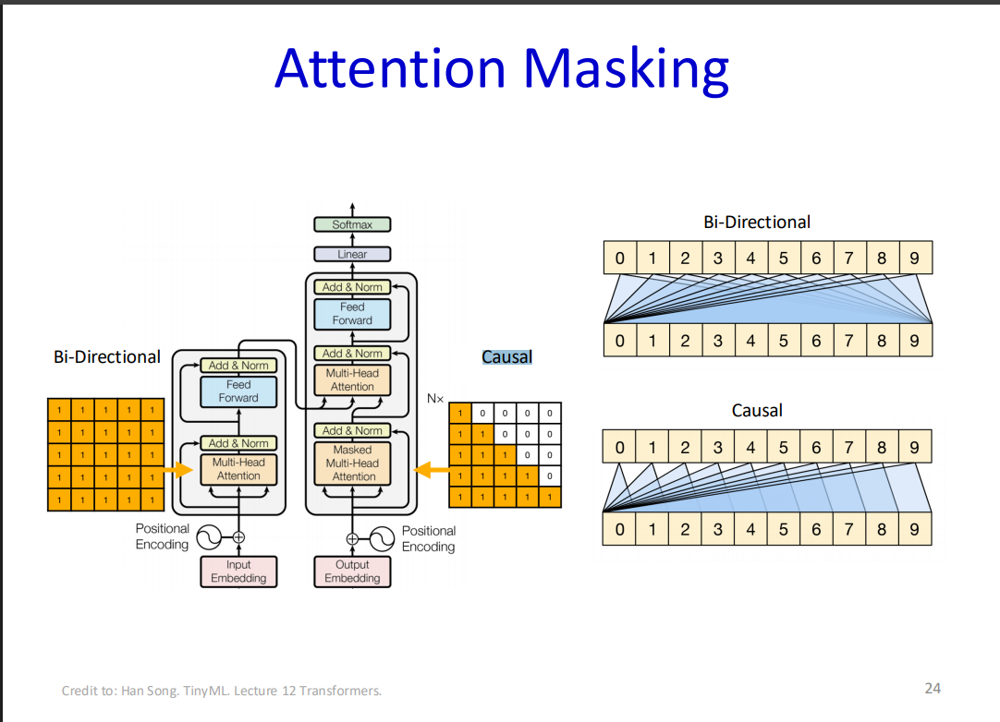

https://deeplearning.cs.cmu.edu/S25/document/slides/lec19.transformer.pdf

CHECKPOINT 8

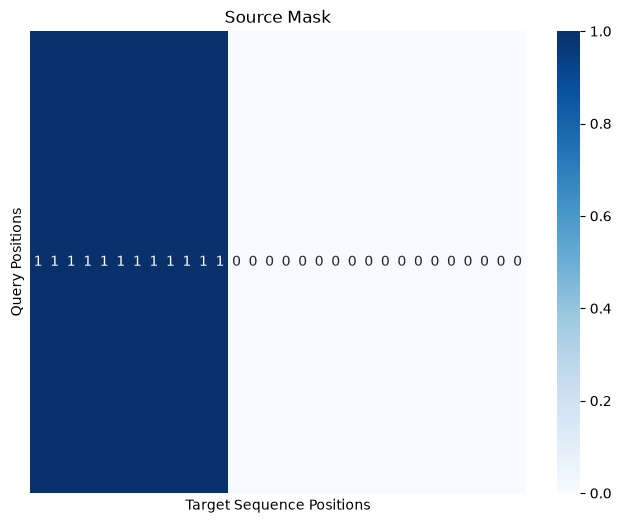

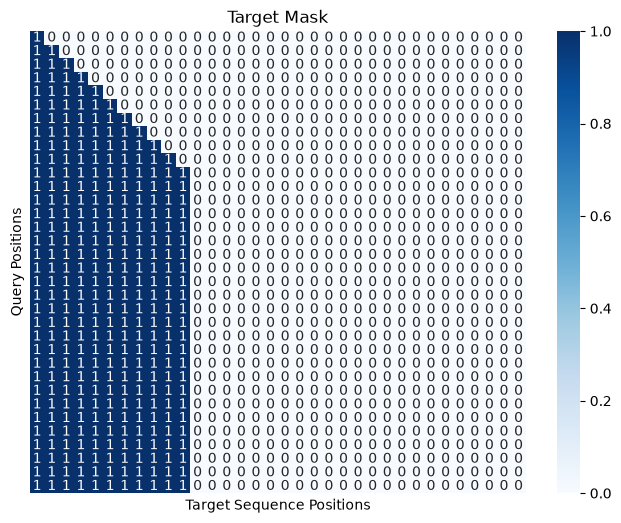

In [71]:
import sacrebleu
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

DEVICE = device

def generate_tgt_mask(tgt, pad_idx, DEVICE):
    seq_len = tgt.size(1)

    # TODO: Check how to implement causal masking using torch.tril
    no_future_mask = torch.tril(
        torch.ones(seq_len, seq_len, dtype=torch.bool, device=tgt.device)
    )

    # TODO: Ignore padding tokens
    pad_mask = (tgt != pad_idx).unsqueeze(1).unsqueeze(2)

    combined_mask = pad_mask & no_future_mask
    return combined_mask

def generate_src_mask(src, pad_idx):
    # Ignore padding tokens
    mask = (src != pad_idx).unsqueeze(1).unsqueeze(2)
    return mask


def calculate_bleu(tgt_output, output):
    tgt_output = tgt_output.cpu().numpy()
    output = output.cpu().numpy()

    refs = []
    hyps = []

    excluded_tokens = (DE_VOCAB['<pad>'], DE_VOCAB['<eos>'], DE_VOCAB['<sos>'])
    for tgt, pred in zip(tgt_output, output):
        ref = ' '.join([DE_VOCAB.itos[t] for t in tgt if t not in excluded_tokens])
        hyp = ' '.join([DE_VOCAB.itos[t] for t in pred if t not in excluded_tokens])

        refs.append(ref)
        hyps.append(hyp)

    bleu = sacrebleu.corpus_bleu(hyps, [refs], force=True).score
    return bleu

import matplotlib.pyplot as plt
import seaborn as sns

def plot_mask(mask, title="Mask Visualization"):
    mask = mask.cpu().numpy()  # Convert tensor to NumPy
    plt.figure(figsize=(8, 6))
    sns.heatmap(mask, cmap="Blues", annot=True, cbar=True, xticklabels=False, yticklabels=False)
    plt.title(title)
    plt.xlabel("Target Sequence Positions")
    plt.ylabel("Query Positions")
    plt.show()

for i, (src, tgt) in enumerate(val_dataloader):
    src, tgt = src.to('cuda'), tgt.to('cuda')

    tgt_input = tgt[:, :-1]
    tgt_output = tgt[:, 1:]

    src_mask = generate_src_mask(src, EN_VOCAB['<pad>'])
    tgt_mask = generate_tgt_mask(tgt_input, DE_VOCAB['<pad>'], device)
    plot_mask(src_mask[0].squeeze(0), title="Source Mask",)
    plot_mask(tgt_mask[0].squeeze(0), title="Target Mask")
    break

### 8.2 Transformer Network

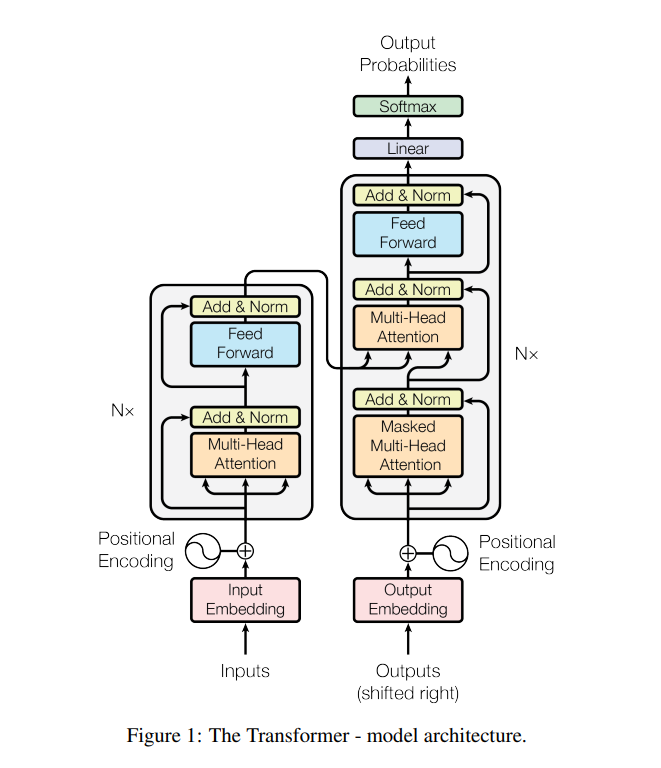

[1] A. Vaswani et al., ‘Attention Is All You Need’, Aug. 02, 2023, arXiv: arXiv:1706.03762. doi: 10.48550/arXiv.1706.03762.


CHECKPOINT 9

In [72]:
class Transformer(nn.Module):
    def __init__(self, src_vocab_size, tgt_vocab_size, D_MODEL, num_heads, d_ff, max_seq_len, encoder_num_layers, decoder_num_layers, dropout=0.1):
        """
        Initialize the Transformer module.

        Args:
        src_vocab_size (int): The size of the source vocabulary.
        tgt_vocab_size (int): The size of the target vocabulary.
        d_model (int): The dimensionality of the embedding
        num_heads (int): The number of attention heads.
        d_ff (int): The dimensionality of the hidden layer in the feed-forward network.
        max_seq_len (int): The maximum length of the input sequence.
        num_layers (int): The number of layers in the encoder and decoder.
        dropout (float, optional): The dropout probability. Defaults to 0.1.
        """
        super(Transformer, self).__init__()

        # TODO: Create Input Embeddings
        self.src_embedding = nn.Embedding(src_vocab_size, D_MODEL)
        self.tgt_embedding = nn.Embedding(tgt_vocab_size, D_MODEL)

        # TODO: Define positional encoding
        self.pos_encoding = PositionalEncoding(D_MODEL, max_seq_len, dropout)

        self.encoder_layers = nn.ModuleList([EncoderBlock(D_MODEL, num_heads, d_ff, dropout) for _ in range(encoder_num_layers)])
        self.decoder_layers = nn.ModuleList([DecoderBlock(D_MODEL, num_heads, d_ff, dropout) for _ in range(decoder_num_layers)])

        # TODO: Final Output
        self.fc = nn.Linear(D_MODEL, tgt_vocab_size)

    def forward(self, src, tgt, src_mask=None, tgt_mask=None):
        """
        Forward pass for Transformer.

        Args:
        src (Tensor): The source input tensor of shape (batch_size, src_seq_length).
        tgt (Tensor): The target input tensor of shape (batch_size, tgt_seq_length).
        src_mask (Tensor, optional): The source mask tensor for ignoring certain elements. Defaults to None.
        tgt_mask (Tensor, optional): The target mask tensor for ignoring certain elements. Defaults to None.

        Returns:
        Tensor: The output tensor of shape (batch_size, tgt_seq_length, tgt_vocab_size).
        """
        # TODO: Create embeddings and position encoding for source and target messages
        src = self.src_embedding(src)
        src = self.pos_encoding(src)

        tgt = self.tgt_embedding(tgt)
        tgt = self.pos_encoding(tgt)

        # TODO: Pass forward through each layer adding the appropriate masking
        for layer in self.encoder_layers:
            src = layer(src, src_mask)

        for layer in self.decoder_layers:
            tgt = layer(tgt, src, src_mask, tgt_mask)

        out = self.fc(tgt)

        return out

# DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE = "cuda"

src, tgt = next(iter(train_dataloader))
src, tgt = src.to(DEVICE), tgt.to(DEVICE)

src_mask = generate_src_mask(src, EN_VOCAB['<pad>'])

tgt_input = tgt[:, :-1]
tgt_output = tgt[:, 1:]
tgt_mask = generate_tgt_mask(tgt_input, DE_VOCAB['<pad>'], DEVICE)

model = Transformer(len(EN_VOCAB), len(DE_VOCAB), 256, 4, 256, 1000, 4, 4, 0.1).to(DEVICE)

model_summary = torchinfo_summary(model, input_data=[src, tgt_input, src_mask, tgt_mask])
model_summary

Layer (type:depth-idx)                        Output Shape              Param #
Transformer                                   [128, 28, 8014]           --
├─Embedding: 1-1                              [128, 28, 256]            1,584,896
├─PositionalEncoding: 1-2                     [128, 28, 256]            --
│    └─Dropout: 2-1                           [128, 28, 256]            --
├─Embedding: 1-3                              [128, 28, 256]            2,051,584
├─PositionalEncoding: 1-4                     [128, 28, 256]            --
│    └─Dropout: 2-2                           [128, 28, 256]            --
├─ModuleList: 1-5                             --                        --
│    └─EncoderBlock: 2-3                      [128, 28, 256]            --
│    │    └─MultiHeadSelfAttention: 3-1       [128, 28, 256]            263,168
│    │    └─AddNorm: 3-2                      [128, 28, 256]            512
│    │    └─PositionwiseFeedForward: 3-3      [128, 28, 256]            131

### 8.3 Hyper Parameter Tuning

In [73]:
EPOCHS = 5
EMBED_SIZE = 256
ATTENTION_HEADS = 8
ENCODER_LAYERS = 3
DECODER_LAYERS = 3
FEEDFORWARD_DIM = 512
MAX_SEQ_LEN = 150
SRC_VOCAB_SIZE = len(EN_VOCAB)
TGT_VOCAB_SIZE = len(DE_VOCAB)
LR = 3e-4
DROPOUT = 0.1
SCHEDULER_GAMMA = 0.001
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [74]:
model = Transformer(SRC_VOCAB_SIZE, TGT_VOCAB_SIZE, EMBED_SIZE, ATTENTION_HEADS, FEEDFORWARD_DIM, MAX_SEQ_LEN, ENCODER_LAYERS, DECODER_LAYERS, DROPOUT).to(DEVICE)

model = model.to(DEVICE)

optimizer = torch.optim.AdamW(model.parameters(), lr=LR, betas=(0.9,0.98), eps=1e-9, weight_decay=5e-2)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, EPOCHS)
criterion = torch.nn.CrossEntropyLoss(ignore_index=DE_VOCAB['<pad>'], label_smoothing=0.1)
scaler = torch.cuda.amp.GradScaler()

### 8.4 Helper Functions

#### Train, Validate, and Inference Functions

In [75]:
def train_epoch(model, dataloader, optimizer, criterion, device):

    model.train()
    total_loss = 0

    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True,
                     leave=False, position=0, desc='Train')

    for i, (src, tgt) in enumerate(dataloader):

        src, tgt = src.to(device), tgt.to(device)
        src_mask = generate_src_mask(src, EN_VOCAB['<pad>'])

        tgt_input   = tgt[:, :-1]
        tgt_output  = tgt[:, 1:]

        tgt_mask = generate_tgt_mask(tgt_input, DE_VOCAB['<pad>'], device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():

            output = model(src, tgt_input, src_mask, tgt_mask)

            loss = criterion(output.reshape(-1, output.size(2)), tgt_output.reshape(-1))

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

        batch_bar.set_postfix(
            loss="{:.04f}".format(total_loss / (i + 1)),
            lr="{:.09f}".format(float(optimizer.param_groups[0]['lr'])))
        batch_bar.update()

    scheduler.step()

    return total_loss / len(dataloader)

def validate_epoch(model, dataloader, criterion, DEVICE):

    model.eval()
    epoch_loss = 0
    # This is teacher-forced token BLEU, useful for diagnostics only.
    # Use the autoregressive test BLEU below for translation quality.
    epoch_teacher_forced_bleu = 0

    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True,
                     leave=False, position=0, desc='Validate')

    with torch.no_grad():

        for i, (src, tgt) in enumerate(dataloader):

            src, tgt = src.to(DEVICE), tgt.to(DEVICE)

            tgt_input = tgt[:, :-1]
            tgt_output = tgt[:, 1:]

            src_mask = generate_src_mask(src, EN_VOCAB['<pad>'])
            tgt_mask = generate_tgt_mask(tgt_input, DE_VOCAB['<pad>'], DEVICE)

            with torch.cuda.amp.autocast():

                output = model(src, tgt_input, src_mask, tgt_mask)
                loss = criterion(output.reshape(-1, output.shape[-1]), tgt_output.reshape(-1))

            epoch_loss += loss.item()
            epoch_teacher_forced_bleu += calculate_bleu(tgt_output, output.argmax(-1))

            batch_bar.set_postfix(
            loss="{:.04f}".format(epoch_loss / (i + 1)),
            teacher_forced_bleu="{:.04f}".format(epoch_teacher_forced_bleu / (i + 1)))

            batch_bar.update()

    # Normalize the loss and BLEU score by the number of validation samples
    epoch_loss /= len(dataloader)
    epoch_teacher_forced_bleu /= len(dataloader)

    return epoch_loss, epoch_teacher_forced_bleu

## (9) Training

In [76]:
best_val_loss = float('inf')
train_losses = []
val_losses = []
bleu_scores = []

for epoch in range(1, EPOCHS + 1):

    print(f"Epoch {epoch}/{EPOCHS}")

    # Training
    train_loss = train_epoch(model, train_dataloader, optimizer, criterion, DEVICE)
    train_losses.append(train_loss)

    # Validation
    val_loss, teacher_forced_bleu = validate_epoch(model, val_dataloader, criterion, DEVICE)
    val_losses.append(val_loss)
    bleu_scores.append(teacher_forced_bleu)

    # Update learning rate
    # scheduler.step()

    # Print results
    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Teacher-forced BLEU: {teacher_forced_bleu:.4f}")

    # Save the model with the best validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')

Epoch 1/5


Train Loss: 4.9664 | Val Loss: 4.0162 | Teacher-forced BLEU: 7.9749
Epoch 2/5


Train Loss: 3.8481 | Val Loss: 3.5769 | Teacher-forced BLEU: 10.2856
Epoch 3/5


Train Loss: 3.5856 | Val Loss: 3.6841 | Teacher-forced BLEU: 10.3824
Epoch 4/5


Train Loss: 4.5028 | Val Loss: 4.4903 | Teacher-forced BLEU: 8.0421
Epoch 5/5


Train Loss: 4.6329 | Val Loss: 4.4896 | Teacher-forced BLEU: 8.0446


## (10) Testing

CHECKPOINT 10

In [77]:

def inference(model, src, de_tokenizer):

    model.eval()

    src_mask = generate_src_mask(src, EN_VOCAB['<pad>'])

    # Initialize target input tensors with <sos> tokens
    tgt_input = torch.full((src.size(0), 1), DE_VOCAB['<sos>'], dtype=torch.long, device=DEVICE)

    # Create a flag for each sequence in the batch
    eos_flags = torch.zeros(src.size(0), dtype=torch.bool, device=DEVICE)

    # Perform inference for each target token
    with torch.no_grad():

        for _ in range(70):

            tgt_mask = generate_tgt_mask(tgt_input, DE_VOCAB['<pad>'], device)
            output = model(src, tgt_input, src_mask, tgt_mask)
            next_tokens = output.argmax(2)[:, -1].unsqueeze(1)

            # TODO: What is the input for the next word prediction?
            tgt_input = torch.cat([tgt_input, next_tokens], dim=1)

            # Update the eos_flags for sequences that have generated <eos>
            eos_flags |= (next_tokens.squeeze() == DE_VOCAB['<eos>'])

            # Stop generating tokens if all sequences have generated <eos> or reached maximum length
            if torch.all(eos_flags):
                break

    # Convert target input tensors to translated sentences
    translated_sentences = []
    for i in range(tgt_input.size(0)):

        translated_tokens = []

        for token in tgt_input[i][1:]:
            if token == DE_VOCAB['<eos>']:
                break
            else:
                # TODO: Change numberical token indices back to corresponding words
                translated_tokens.append(DE_VOCAB.itos[token.item()])

        translated_sentence = ' '.join(translated_tokens)
        translated_sentences.append(translated_sentence)

    return translated_sentences

In [78]:
def evaluate_test_set_bleu(model, test_dataloader, de_tokenizer):

    translated_sentences = []
    ground_truth_sentences = []
    source_sentences = []

    for batch in tqdm(test_dataloader, desc="Evaluating"):
        src, tgt_output = batch
        src, tgt = src.to(DEVICE), tgt_output.to(DEVICE)
        src_sentences = [' '.join([EN_VOCAB.itos[token.item()] for token in sequence if token.item() not in [EN_VOCAB['<pad>'], EN_VOCAB['<sos>'], EN_VOCAB['<eos>']]]) for sequence in src]
        tgt_sentences = [' '.join([DE_VOCAB.itos[token.item()] for token in sequence if token.item() not in [DE_VOCAB['<pad>'], DE_VOCAB['<sos>'], DE_VOCAB['<eos>']]]) for sequence in tgt_output]

        translations = inference(model, src, de_tokenizer)
        source_sentences.extend(src_sentences)
        translated_sentences.extend(translations)
        ground_truth_sentences.extend([[tgt] for tgt in tgt_sentences])

    rand_index = random.randrange(len(translated_sentences))
    print("\n\nExample Sentence and its Translation")
    print("Source Sentence in English               :", source_sentences[rand_index])
    print("Ground Truth Sentence in German          :", ground_truth_sentences[rand_index][0])
    print("Machine Translated Sentence in German    :", translated_sentences[rand_index])
    bleu_score = sacrebleu.corpus_bleu(translated_sentences, ground_truth_sentences)

    return bleu_score

# Evaluate the checkpoint selected by validation loss, not the final epoch.
model.load_state_dict(torch.load("best_model.pth", map_location=DEVICE))
model.to(DEVICE)
test_bleu = evaluate_test_set_bleu(model, test_dataloader, de_tokenizer)
print("Test BLEU score:", test_bleu.score)

Evaluating: 100%|██████████| 8/8 [00:02<00:00,  3.92it/s]



Example Sentence and its Translation
Source Sentence in English               : Many people are sitting around a tent outside .
Ground Truth Sentence in German          : Viele Menschen sitzen um ein Zelt im Freien .
Machine Translated Sentence in German    : Viele Menschen sitzen um einen Tisch herum .
Test BLEU score: 58.14307369682194


Optional Readings:

# (Optional) III. Vision Transformer (ViT)
Hi, this part of the recitaiton will walk you through how to implement a vision transformer from scratch for the MNIST dataset.

The Vision Transfomer (ViT) was first introduced in 2020: https://arxiv.org/abs/2010.11929v2

Notebook outline:
- Libraries
- Dataset
- Tokenization
- Model Architecture
  - Positional Encoding
  - Attention
  - ViT Block (Add & Norm, Feed-Forward)
  - Vision Transformer Encoder
- Training
- Testing

## (1) Libraries

In [79]:
!nvidia-smi

Mon Aug 17 04:48:15 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 610.43.02              KMD Version: 610.43.02     CUDA UMD Version: 13.3     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        On  |   00000000:CF:00.0 Off |                  Off |
| 33%   35C    P2            149W /  450W |   16667MiB /  24564MiB |      4%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [81]:
import numpy as np
import torch
import torch.nn as nn
from torch.nn import CrossEntropyLoss
from torch.optim import Adam
from tqdm.notebook import tqdm, trange
import torch.nn.functional as F
import matplotlib.pyplot as plt
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## (2) Dataset

In [82]:
from torch.utils.data import DataLoader
from torchvision.datasets.mnist import MNIST
from torchvision.transforms import ToTensor

root = "./../datasets"
transform = ToTensor()

train_set = MNIST(root, train=True, download=True, transform=transform)
test_set = MNIST(root, train=False, download=True, transform=transform)

train_loader = DataLoader(train_set, shuffle=True, batch_size=128)
test_loader = DataLoader(test_set, shuffle=False, batch_size=128)

Failed to download (trying next):
HTTP Error 404: Not Found




KeyboardInterrupt: 

Source: MNIST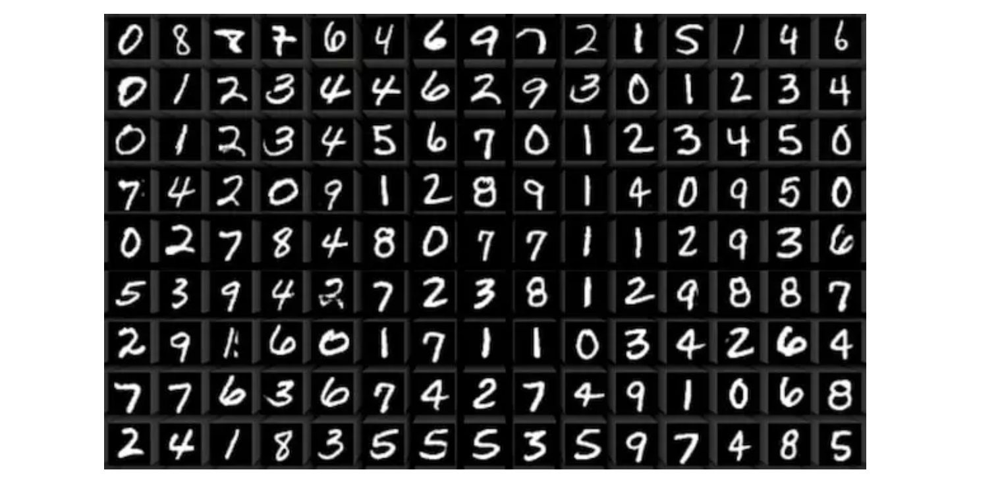

## (3) Tokenization
The process of dividing an input image into smaller, non-overlapping patches. Each patch serves as a token that undergoes subsequent processing within the transformer architecture. Localized Feature Representation: Images can be large, and processing them pixel-wise in transformers would be computationally expensive. Using Patches allows transformers to focus on smaller, localized regions, capturing meaningful features efficiently.

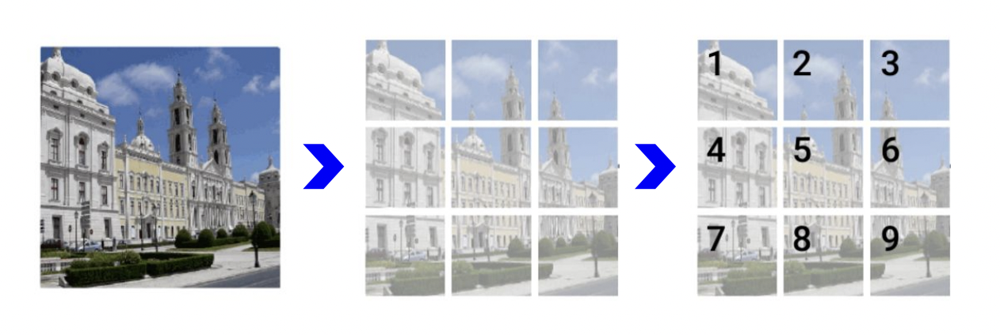

In [ ]:
def patchify(images, n_patches):
    """
    Extracts patches from a batch of images and returns them as a tensor.
    The images are divided into n_patches x n_patches patches.
    The patches are flattened to 1D vectors.
    The patches are stacked along the second dimension (dim=1).

    Args:
        images (torch.Tensor): Batch of images to extract patches from.
        n_patches (int): Number of patches to extract in each dimension.

    Returns:
        torch.Tensor: Tensor containing the patches.
    """


    # Get the dimensions of the images
    num_images, channels, height, width = images.shape

    assert height == width, "Images must be square"

    # Initialize an empty list to store patches
    patches_list = []

    # Loop through patch indices
    for i in range(n_patches):
        for j in range(n_patches):
            # Extract the current patch from each image and flatten it
            patch = images[:, :, i * height // n_patches : (i + 1) * height // n_patches, j * width // n_patches : (j + 1) * width // n_patches].flatten(1)

            # Append the flattened patch to the list
            patches_list.append(patch)

    # Stack the patches along the specified dimension (dim=1)
    patches = torch.stack(patches_list, dim=1)

    return patches

## (4) Model Architecture

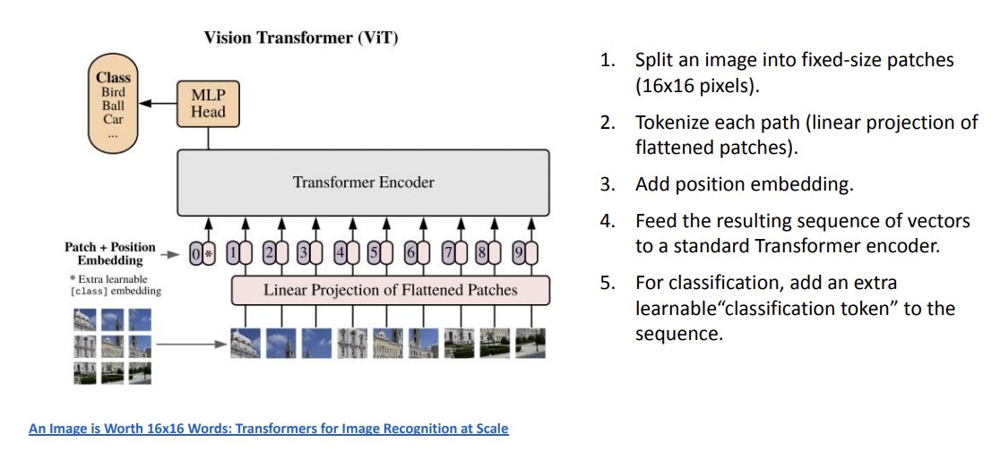

### 4.1 Positional Encoding

In [ ]:
def get_positional_embeddings(sequence_length, d):
    result = torch.ones(sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[i][j] = (
                np.sin(i / (10000 ** (j / d))) # The use of 10000 and d is a heuristic that has been found to work well in practice,
                                              ## helping the model to better differentiate positions.
                if j % 2 == 0
                else np.cos(i / (10000 ** ((j - 1) / d)))
            )
    return result

### 4.2 Attention

In [ ]:
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, d_model, num_heads):
        """
        Applies multi-head self-attention to input sequences.

        This module takes input sequences and performs multi-head self-attention, allowing the model to
        focus on different parts of the input sequences simultaneously. It consists of linear mappings
        for queries, keys, and values, and employs the scaled dot-product attention mechanism.
        The output is obtained by concatenating and linearly transforming the attention-weighted values.

        Args:
        sequences (torch.Tensor): Input tensor of shape (batch_size, seq_length, d_model).
        mask (torch.Tensor, optional): Mask tensor for ignoring certain elements. Defaults to None.

        Returns:
        torch.Tensor: Output tensor of shape (batch_size, seq_length, d_model).
        """
        super(MultiHeadSelfAttention, self).__init__()
        self.d_model = d_model
        self.num_heads = num_heads
        self.head_dim = d_model // num_heads

        assert self.head_dim * num_heads == d_model, "Invalid number of heads or d_model dimensions"

        # Linear mappings for queries, keys, and values
        self.wq = nn.Linear(d_model, d_model)
        self.wk = nn.Linear(d_model, d_model)
        self.wv = nn.Linear(d_model, d_model)

        # Linear mapping for the output
        self.wo = nn.Linear(d_model, d_model)

    def forward(self, sequences, mask=None):
        """
        Forward pass for MultiHeadSelfAttention.

        Args:
            sequences (Tensor): The input tensor of shape (batch_size, seq_length, d_model).
            mask (Tensor, optional): The mask tensor for ignoring certain elements. Defaults to None.

        Returns:
            Tensor: The output tensor of shape (batch_size, seq_length, d_model).
        """
        batch_size, seq_length, _ = sequences.size()

        # Apply linear mappings for queries, keys, and values
        q = self.wq(sequences).view(batch_size, -1, self.num_heads, self.head_dim)
        k = self.wk(sequences).view(batch_size, -1, self.num_heads, self.head_dim)
        v = self.wv(sequences).view(batch_size, -1, self.num_heads, self.head_dim)

        # Transpose dimensions for compatibility with attention computation
        q = q.transpose(1, 2)
        k = k.transpose(1, 2)
        v = v.transpose(1, 2)

        # Compute scaled dot-product attention
        attn = torch.matmul(q, k.transpose(-2, -1)) / (self.head_dim ** 0.5)

        # Apply mask if provided
        if mask is not None:
            attn = attn.masked_fill(mask == 0, float('-inf'))

        # Apply softmax activation to obtain attention weights
        attn = F.softmax(attn, dim=-1)

        # Compute the weighted sum of values
        out = torch.matmul(attn, v).transpose(1, 2).contiguous().view(batch_size, -1, self.d_model)

        # Apply linear mapping for the final output
        out = self.wo(out)

        return out

### 4.3 ViT Block (Add & Norm, Feed-Forward)

In [ ]:
class ViTBlock(nn.Module):
    def __init__(self, hidden_dim, num_heads, mlp_ratio=4):
        """
        Initialize the ViTBlock module.

        Args:
            hidden_dim (int): The dimensionality of the hidden state.
            num_heads (int): The number of attention heads.
            mlp_ratio (int, optional): The ratio of the hidden dimension in the MLP. Defaults to 4.
        """
        super(ViTBlock, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_heads = num_heads

        # Layer normalization for the Multi-Head Self Attention (MHSA) and the MLP
        self.norm1 = nn.LayerNorm(hidden_dim)
        self.mhsa = MultiHeadSelfAttention(hidden_dim, num_heads)
        self.norm2 = nn.LayerNorm(hidden_dim)

        # Multi-Layer Perceptron (MLP) for feature transformation
        self.mlp = nn.Sequential(
            nn.Linear(hidden_dim, mlp_ratio * hidden_dim),
            nn.GELU(),  # GELU activation function
            nn.Linear(mlp_ratio * hidden_dim, hidden_dim),
        )

    def forward(self, x):
        """
        Forward pass for ViTBlock.

        Args:
            x (Tensor): The input tensor of shape (batch_size, seq_length, hidden_dim).

        Returns:
            Tensor: The output tensor of shape (batch_size, seq_length, hidden_dim).
        """
        # Apply LayerNorm and Multi-Head Self Attention (MHSA)
        mhsa_out = self.mhsa(self.norm1(x))

        # Add the original input to the MHSA output (residual connection)
        out = x + mhsa_out

        # Apply LayerNorm and Multi-Layer Perceptron (MLP)
        mlp_out = self.mlp(self.norm2(out))

        # Add the original input to the MLP output (residual connection)
        out = out + mlp_out

        return out

### 4.4 Vision Transformer Encoder

In [ ]:
class ViT(nn.Module):
    def __init__(self, input_shape, n_patches=7, n_blocks=2, hidden_dim=8, n_heads=2, output_dim=10):
        """
        Initialize the ViT module.

        Args:
            input_shape (tuple): Shape of the input images (C, H, W).
            n_patches (int, optional): Number of patches in each dimension. Defaults to 7.
            n_blocks (int, optional): Number of transformer blocks. Defaults to 2.
            hidden_dim (int, optional): Dimensionality of the hidden state. Defaults to 8.
            n_heads (int, optional): Number of attention heads. Defaults to 2.
            output_dim (int, optional): Dimensionality of the output. Defaults to 10.
        """
        # Super constructor
        super(ViT, self).__init__()

        # Attributes
        self.input_shape = input_shape  # (C, H, W)
        self.n_patches = n_patches
        self.n_blocks = n_blocks
        self.n_heads = n_heads
        self.hidden_dim = hidden_dim

        # Input and patches sizes
        assert (input_shape[1] % n_patches == 0), "Input shape not entirely divisible by the number of patches"
        assert (input_shape[2] % n_patches == 0), "Input shape not entirely divisible by the number of patches"

        self.patch_size = (input_shape[1] / n_patches, input_shape[2] / n_patches)

        # 1) Linear mapper
        self.input_dim = int(input_shape[0] * self.patch_size[0] * self.patch_size[1])
        self.linear_mapper = nn.Linear(self.input_dim, hidden_dim)

        # 2) Learnable classification token
        self.class_token = nn.Parameter(torch.rand(1, hidden_dim))

        # 3) Positional embedding
        self.register_buffer("positional_embeddings",get_positional_embeddings(n_patches**2 + 1, hidden_dim),
            persistent=False)

        # 4) Transformer encoder blocks
        self.blocks = nn.ModuleList([ViTBlock(hidden_dim, n_heads)] * n_blocks)

        # 5) Classification MLP
        self.mlp = nn.Sequential(nn.Linear(hidden_dim, output_dim), nn.Softmax(dim=-1))

    def forward(self, images):
        """
        Forward pass for ViT.

        Args:
            images (Tensor): Batch of input images.

        Returns:
            Tensor: Output category distribution.
        """
        # Dividing images into patches
        batch_size, _, _, _ = images.shape
        patches = patchify(images, self.n_patches).to(self.positional_embeddings.device)

        # Running linear layer tokenization
        # Map the vector corresponding to each patch to the hidden size dimension
        tokens = self.linear_mapper(patches)

        # Adding classification token to the tokens
        tokens = torch.cat((self.class_token.expand(batch_size, 1, -1), tokens), dim=1)

        # Adding positional embedding
        out = tokens + self.positional_embeddings.repeat(batch_size, 1, 1)

        # Transformer Blocks
        for block in self.blocks:
            out = block(out)

        # Getting the classification token only
        out = out[:, 0]

        return self.mlp(out)  # Map to output dimension, output category distribution

## (5) Training

In [ ]:
# Define Hyperparameters
N_EPOCHS = 5
LR = 0.005
BATCH_SIZE = 128
N_PATCHES = 7
N_BLOCKS = 2
HIDDEN_DIM = 16
N_HEADS = 4
OUTPUT_DIM = 10

In [ ]:
from torchsummaryX import summary

# Model summary
model = ViT((1, 28, 28), N_PATCHES, N_BLOCKS, HIDDEN_DIM, N_HEADS, OUTPUT_DIM).to(device)
summary(model, torch.zeros((1, 1, 28, 28)))

In [ ]:
 # Training loop
optimizer = Adam(model.parameters(), lr=LR)
criterion = CrossEntropyLoss()
for epoch in trange(N_EPOCHS, desc="Training"):
    train_loss = 0.0
    for batch in tqdm(
        train_loader, desc=f"Epoch {epoch + 1} in training", leave=False
    ):
        x, y = batch
        x, y = x.to(device), y.to(device)
        y_hat = model(x)
        loss = criterion(y_hat, y)

        train_loss += loss.detach().cpu().item() / len(train_loader)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch + 1}/{N_EPOCHS} loss: {train_loss:.2f}")

## (6) Testing

In [ ]:
# Test loop
with torch.no_grad():
    correct, total = 0, 0
    test_loss = 0.0
    for batch in tqdm(test_loader, desc="Testing"):
        x, y = batch
        x, y = x.to(device), y.to(device)
        y_hat = model(x)
        loss = criterion(y_hat, y)
        test_loss += loss.detach().cpu().item() / len(test_loader)

        correct += torch.sum(torch.argmax(y_hat, dim=1) == y).detach().cpu().item()
        total += len(x)
    print(f"Test loss: {test_loss:.2f}")
    print(f"Test accuracy: {correct / total * 100:.2f}%")

In [ ]:
# Show some predictions
with torch.no_grad():
    x, y = next(iter(test_loader))
    x, y = x.to(device), y.to(device)
    y_hat = model(x)
    y_hat = torch.argmax(y_hat, dim=1)

    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(4):
        for j in range(4):
            axs[i, j].imshow(x[i * 4 + j].cpu().view(28, 28), cmap="gray")
            axs[i, j].set_title(f"Predicted: {y_hat[i * 4 + j]}, Target: {y[i * 4 + j]}")
            axs[i, j].axis("off")
    plt.show()

# Thank You for your ATTENTION😉😁